In [43]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

## Week 5: GANs

## Problem Description

Goal: Take a normal photo and generate a Monet-style version of it using a GAN

The dataset comes with two folders:
* monet_jpg/ – ~300 Monet paintings
* photo_jpg/ – ~7,000 real photos (landscapes, buildings, trees, water, etc.)

All images are already:
* RGB
* ~256×256
* clean, nicely formatted, and easy to load

Because this is image-to-image translation, I’m treating this as a two-domain GAN problem where:
* Domain A = Monet paintings
* Domain B = real photos
* The goal is to learn B to A (photo to Monet)

Preprocessing is super minimal:
* Load images from each folder
* Convert to tensors
* Normalize pixel values ([-1, 1])
* Optionally resize to 256×256 just to keep everything consistent

In [44]:
# Imports
import matplotlib.pyplot as plt
from PIL import Image
import random
from pathlib import Path
import os
import tensorflow as tf
from tensorflow.keras import layers, Model

In [45]:
# Inspect folder and counts

DATA_ROOT = Path("/kaggle/input/gan-getting-started")
print("Root contents:", os.listdir(DATA_ROOT))

monet_dir = DATA_ROOT / "monet_jpg"
photo_dir = DATA_ROOT / "photo_jpg"

print("Monet dir exists:", monet_dir.exists())
print("Photo dir exists:", photo_dir.exists())

monet_files = sorted(os.listdir(monet_dir))
photo_files = sorted(os.listdir(photo_dir))

print("Number of Monet images:", len(monet_files))
print("Number of photo images:", len(photo_files))

monet_files[:5], photo_files[:5]


Root contents: ['monet_jpg', 'photo_tfrec', 'photo_jpg', 'monet_tfrec']
Monet dir exists: True
Photo dir exists: True
Number of Monet images: 300
Number of photo images: 7038


(['000c1e3bff.jpg',
  '011835cfbf.jpg',
  '0260d15306.jpg',
  '049e293b93.jpg',
  '05144e306f.jpg'],
 ['00068bc07f.jpg',
  '000910d219.jpg',
  '000ded5c41.jpg',
  '00104fd531.jpg',
  '001158d595.jpg'])

## EDA

I started by looking at the foler structure and doing a check of the data. I viewed some images and checked the image sizes. 

The dataset comes with two folders:
* monet_jpg/ – ~300 Monet paintings
* photo_jpg/ – ~7,000 real photos 

Cleaning:
* Convert everything to RGB
* Resize to a consistent 256 × 256
* Normalize pixel values to [-1, 1] so they work well with tanh in the generator
* Wrap both domains into tf.data pipelines with shuffle + batching

Plan based on EDA:
* Treat this as a two-domain image-to-image problem (photo to Monet)
* Use the preprocessed Monet set as the target style and the photo set as the content domain
* Train a GAN, CycleGAN-style or Monet-generator-only setup, on 256×256 crops using these pipelines


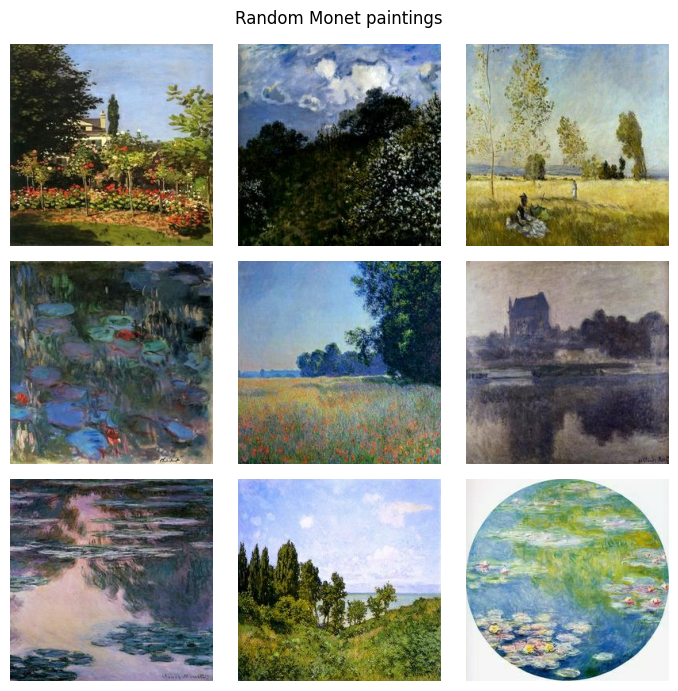

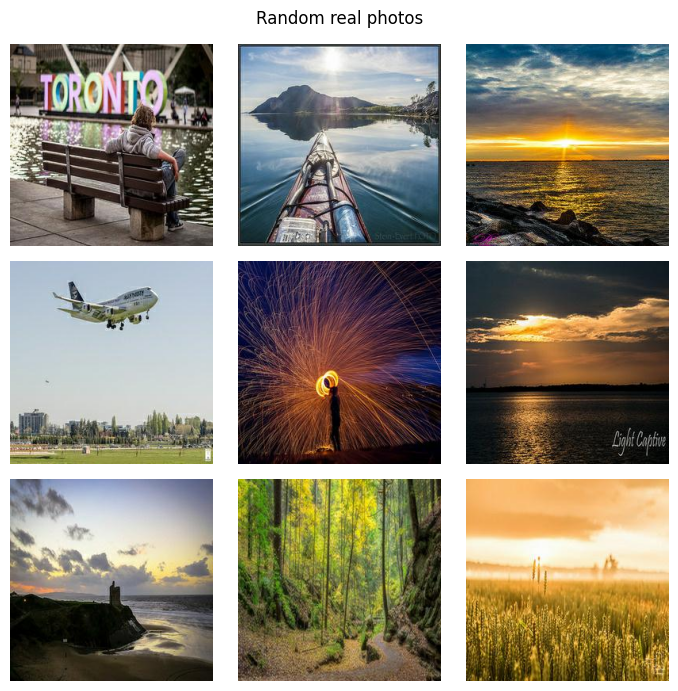

In [46]:
# Visualize a few images
def show_grid(img_paths, title, n=9):
    plt.figure(figsize=(7,7))
    for i, p in enumerate(random.sample(img_paths, n)):
        img = Image.open(p)
        plt.subplot(3, 3, i+1)
        plt.imshow(img)
        plt.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

monet_paths = [monet_dir / f for f in monet_files]
photo_paths = [photo_dir / f for f in photo_files]

show_grid(monet_paths, "Random Monet paintings")
show_grid(photo_paths, "Random real photos")

Monet mean size  (w, h): [256. 256.]
Monet min size   (w, h): [256 256]
Monet max size   (w, h): [256 256]
Photo mean size  (w, h): [256. 256.]
Photo min size   (w, h): [256 256]
Photo max size   (w, h): [256 256]


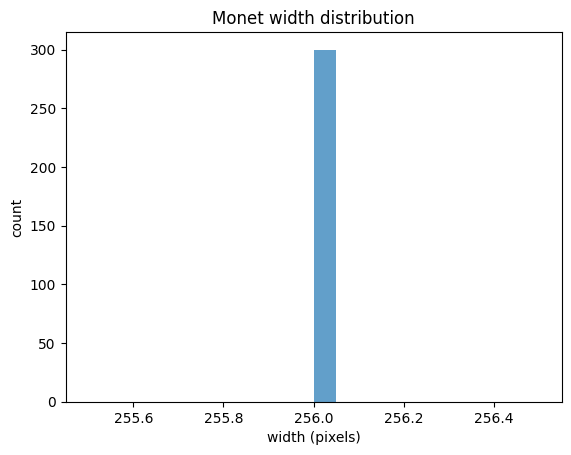

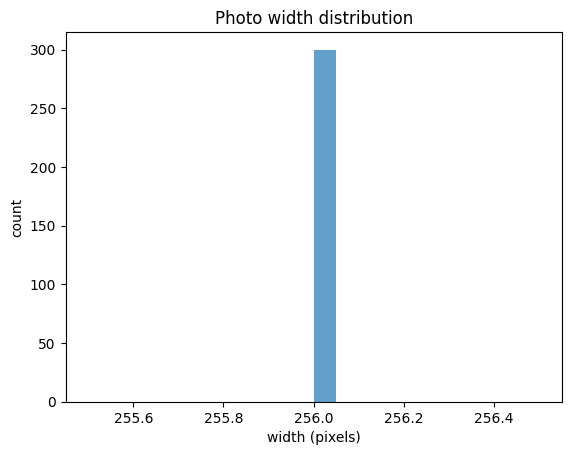

In [47]:
# Check image sizes
def sample_sizes(paths, n=300):
    sample = random.sample(paths, min(n, len(paths)))
    sizes = []
    for p in sample:
        with Image.open(p) as img:
            sizes.append(img.size)  # (width, height)
    return np.array(sizes)

monet_sizes = sample_sizes(monet_paths)
photo_sizes = sample_sizes(photo_paths)

print("Monet mean size  (w, h):", monet_sizes.mean(axis=0))
print("Monet min size   (w, h):", monet_sizes.min(axis=0))
print("Monet max size   (w, h):", monet_sizes.max(axis=0))

print("Photo mean size  (w, h):", photo_sizes.mean(axis=0))
print("Photo min size   (w, h):", photo_sizes.min(axis=0))
print("Photo max size   (w, h):", photo_sizes.max(axis=0))

plt.figure()
plt.hist(monet_sizes[:,0], bins=20, alpha=0.7)
plt.title("Monet width distribution")
plt.xlabel("width (pixels)")
plt.ylabel("count")
plt.show()

plt.figure()
plt.hist(photo_sizes[:,0], bins=20, alpha=0.7)
plt.title("Photo width distribution")
plt.xlabel("width (pixels)")
plt.ylabel("count")
plt.show()

In [48]:
# Cleaning

IMG_SIZE = 256
BATCH_SIZE = 16

def load_and_preprocess(path):
    # read file, decode, make sure it's RGB, resize, normalize to [-1, 1]
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    img = tf.cast(img, tf.float32) / 127.5 - 1.0
    return img

monet_ds = (tf.data.Dataset
            .from_tensor_slices([str(p) for p in monet_paths])
            .map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
            .shuffle(500)
            .batch(BATCH_SIZE)
            .prefetch(tf.data.AUTOTUNE))

photo_ds = (tf.data.Dataset
            .from_tensor_slices([str(p) for p in photo_paths])
            .map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
            .shuffle(1000)
            .batch(BATCH_SIZE)
            .prefetch(tf.data.AUTOTUNE))

# quick sanity check: show one batch
monet_batch = next(iter(monet_ds))
photo_batch = next(iter(photo_ds))

monet_batch.shape, photo_batch.shape


(TensorShape([16, 256, 256, 3]), TensorShape([16, 256, 256, 3]))

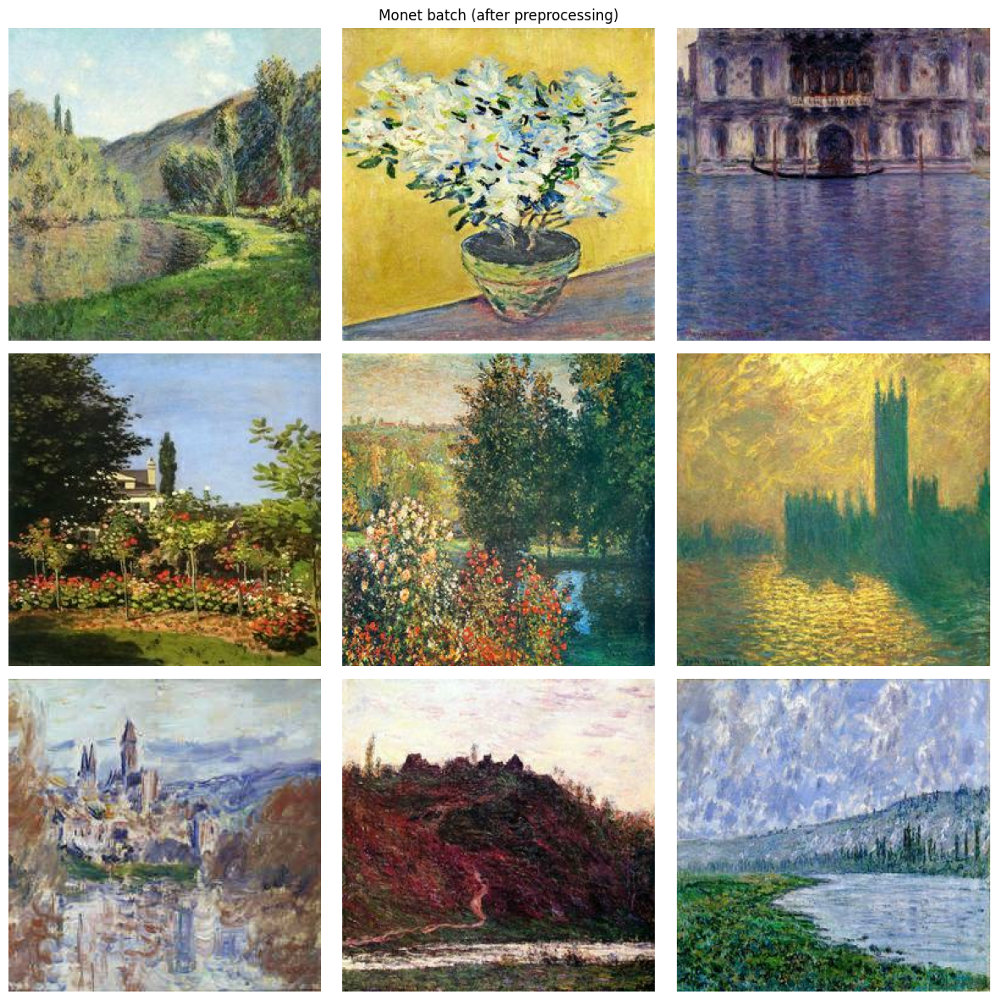

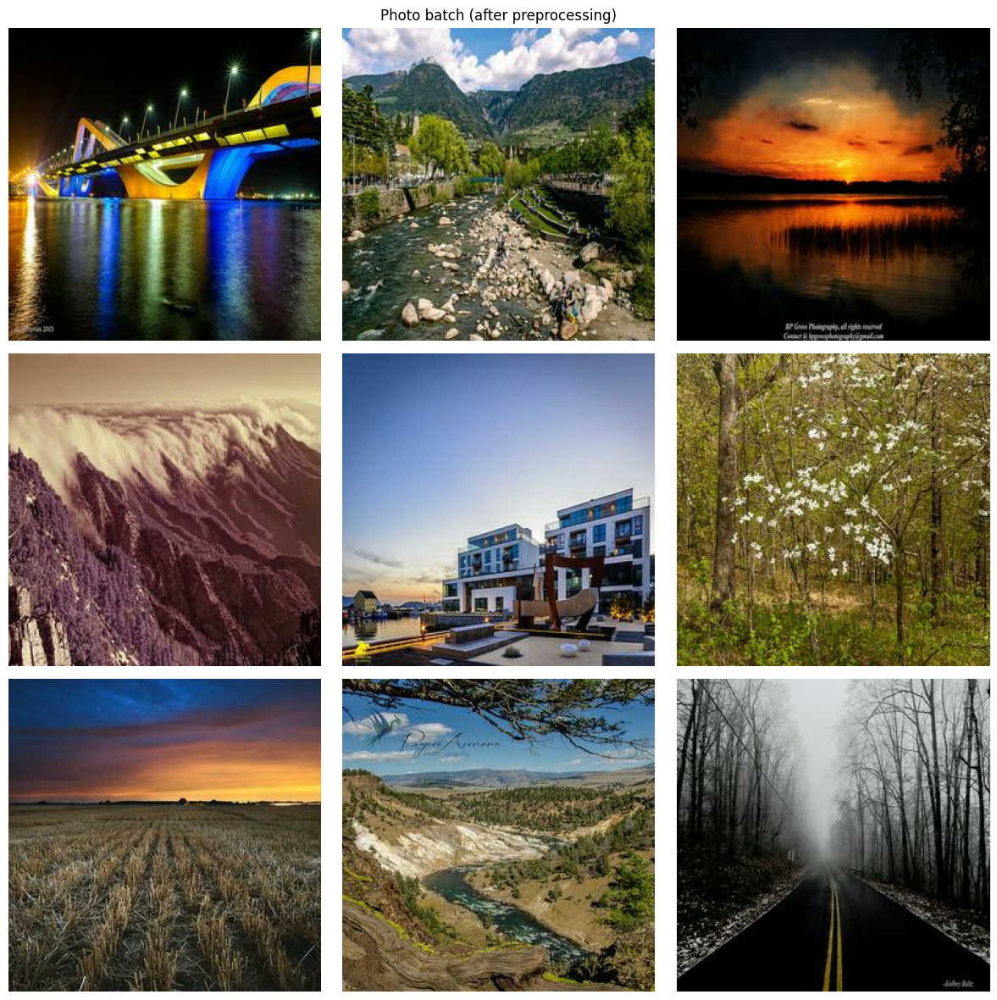

In [49]:
# Check tensors
def show_tensor_batch(batch, title):
    imgs = (batch + 1.0) / 2.0  # back to [0,1]
    imgs = imgs.numpy()
    n = min(9, imgs.shape[0])
    cols = 3
    rows = (n + cols - 1) // cols
    plt.figure(figsize=(4*cols, 4*rows))
    for i in range(n):
        plt.subplot(rows, cols, i+1)
        plt.imshow(imgs[i])
        plt.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

show_tensor_batch(monet_batch, "Monet batch (after preprocessing)")
show_tensor_batch(photo_batch, "Photo batch (after preprocessing)")


## Model Architecture

For this project I’m using a GAN-style setup for image-to-image translation from real photos to Monet style

Generator: photo to Monet
* Input: a 256×256×3 photo
* First, a few conv layers downsample the image into a lower-res feature map
* Then I run it through several residual blocks, which let the network learn “style changes” (color, texture, brush strokes) without destroying the original content too much
* Finally, I upsample back to 256×256 using transpose convolutions and output a 3-channel image with tanh activation (since pixels are normalized to [-1, 1])

Discriminator: Monet vs fake Monet
* Input: a 256×256×3 image, either a real Monet or a generated one
* Uses a stack of strided conv layers, PatchGAN style, to look at local patches of the image
* Outputs a grid of real/fake scores instead of a single number, which encourages the generator to get texture and style right at the patch level

Why:
* Monet vs photo is mostly a style difference, like color palette, brush strokes, texture, rather than completely different content
* The residual generator is good for the edit this image but keep the structure
* The PatchGAN discriminator is lightweight and focuses on local style details, which is what we care about for Monet-like images


In [50]:
# Residual block
IMG_SIZE = 256
IMG_CHANNELS = 3

def residual_block(x, filters, name=None):
    init = x
    x = layers.Conv2D(filters, kernel_size=3, padding="same", use_bias=False, name=f"{name}_conv1")(x)
    x = layers.BatchNormalization(name=f"{name}_bn1")(x)
    x = layers.Activation("relu", name=f"{name}_relu1")(x)

    x = layers.Conv2D(filters, kernel_size=3, padding="same", use_bias=False, name=f"{name}_conv2")(x)
    x = layers.BatchNormalization(name=f"{name}_bn2")(x)

    x = layers.Add(name=f"{name}_add")([init, x])
    x = layers.Activation("relu", name=f"{name}_relu2")(x)
    return x

In [51]:
# Generator
def build_generator(name="generator_photo_to_monet"):
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, IMG_CHANNELS), name="input_image")

    # Encoder: downsample
    x = layers.Conv2D(64, kernel_size=7, padding="same", use_bias=False, name="enc_conv1")(inputs)
    x = layers.BatchNormalization(name="enc_bn1")(x)
    x = layers.Activation("relu", name="enc_relu1")(x)

    x = layers.Conv2D(128, kernel_size=3, strides=2, padding="same", use_bias=False, name="enc_conv2")(x)
    x = layers.BatchNormalization(name="enc_bn2")(x)
    x = layers.Activation("relu", name="enc_relu2")(x)

    x = layers.Conv2D(256, kernel_size=3, strides=2, padding="same", use_bias=False, name="enc_conv3")(x)
    x = layers.BatchNormalization(name="enc_bn3")(x)
    x = layers.Activation("relu", name="enc_relu3")(x)

    # Bottleneck: a few residual blocks
    for i in range(6):
        x = residual_block(x, 256, name=f"resblock_{i+1}")

    # Decoder: upsample back to 256×256
    x = layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding="same", use_bias=False, name="dec_deconv1")(x)
    x = layers.BatchNormalization(name="dec_bn1")(x)
    x = layers.Activation("relu", name="dec_relu1")(x)

    x = layers.Conv2DTranspose(64, kernel_size=3, strides=2, padding="same", use_bias=False, name="dec_deconv2")(x)
    x = layers.BatchNormalization(name="dec_bn2")(x)
    x = layers.Activation("relu", name="dec_relu2")(x)

    # Output: 3 channels, tanh since we normalized to [-1, 1]
    outputs = layers.Conv2D(3, kernel_size=7, padding="same", activation="tanh", name="output_image")(x)

    return Model(inputs, outputs, name=name)

generator_photo_to_monet = build_generator()
generator_photo_to_monet.summary()


Model: "generator_photo_to_monet"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc_conv1 (Conv2D)  │ (None, 256, 256,  │      9,408 │ input_image[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc_bn1             │ (None, 256, 256,  │        256 │ enc_conv1[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc_relu1           │ (None, 256, 256,  │          0 │ enc_bn1[0][0]     │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc_conv2 (Conv2D)  │ (None, 128, 128,  │     73,728 │ enc_relu1[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc_bn2             │ (None, 128, 128,  │        512 │ enc_conv2[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc_relu2           │ (None, 128, 128,  │          0 │ enc_bn2[0][0]     │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc_conv3 (Conv2D)  │ (None, 64, 64,    │    294,912 │ enc_relu2[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc_bn3             │ (None, 64, 64,    │      1,024 │ enc_conv3[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ enc_relu3           │ (None, 64, 64,    │          0 │ enc_bn3[0][0]     │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resblock_1_conv1    │ (None, 64, 64,    │    589,824 │ enc_relu3[0][0]   │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resblock_1_bn1      │ (None, 64, 64,    │      1,024 │ resblock_1_conv1… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resblock_1_relu1    │ (None, 64, 64,    │          0 │ resblock_1_bn1[0… │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resblock_1_conv2    │ (None, 64, 64,    │    589,824 │ resblock_1_relu1… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resblock_1_bn2      │ (None, 64, 64,    │      1,024 │ resblock_1_conv2… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resblock_1_add      │ (None, 64, 64,    │          0 │ enc_relu3[0][0],  │
│ (Add)               │ 256)              │            │ resblock_1_bn2[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resblock_1_relu2    │ (None, 64, 64,    │          0 │ resblock_1_add[0

 Total params: 7,848,835 (29.94 MB)

 Trainable params: 7,841,411 (29.91 MB)

 Non-trainable params: 7,424 (29.00 KB)

In [52]:
# Discriminator
def build_discriminator(name="discriminator_monet"):
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, IMG_CHANNELS), name="disc_input")

    x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same", name="conv1")(inputs)
    x = layers.LeakyReLU(0.2, name="lrelu1")(x)

    x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same", use_bias=False, name="conv2")(x)
    x = layers.BatchNormalization(name="bn2")(x)
    x = layers.LeakyReLU(0.2, name="lrelu2")(x)

    x = layers.Conv2D(256, kernel_size=4, strides=2, padding="same", use_bias=False, name="conv3")(x)
    x = layers.BatchNormalization(name="bn3")(x)
    x = layers.LeakyReLU(0.2, name="lrelu3")(x)

    x = layers.Conv2D(512, kernel_size=4, strides=1, padding="same", use_bias=False, name="conv4")(x)
    x = layers.BatchNormalization(name="bn4")(x)
    x = layers.LeakyReLU(0.2, name="lrelu4")(x)

    # PatchGAN output: grid of real/fake probabilities
    outputs = layers.Conv2D(1, kernel_size=4, strides=1, padding="same", activation="sigmoid", name="output")(x)

    return Model(inputs, outputs, name=name)

discriminator_monet = build_discriminator()
discriminator_monet.summary()


Model: "discriminator_monet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ disc_input (InputLayer)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 128, 128, 64)   │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lrelu1 (LeakyReLU)              │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2 (Conv2D)                  │ (None, 64, 64, 128)    │       131,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn2 (BatchNormalization)        │ (None, 64, 64, 128)    │           512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lrelu2 (LeakyReLU)              │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv3 (Conv2D)                  │ (None, 32, 32, 256)    │       524,288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn3 (BatchNormalization)        │ (None, 32, 32, 256)    │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lrelu3 (LeakyReLU)              │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv4 (Conv2D)                  │ (None, 32, 32, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn4 (BatchNormalization)        │ (None, 32, 32, 512)    │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lrelu4 (LeakyReLU)              │ (None, 32, 32, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Conv2D)                 │ (None, 32, 32, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,767,425 (10.56 MB)

 Trainable params: 2,765,633 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)

## Results & Analysis

I trained the GAN for around N epochs with a batch size of 16. Early on the generator outputs were very noisy, but after a few epochs they started to pick up Monet-like colors with warmer tones, stronger contrasts, more “painted” skies and water

I tried a couple of quick variations:
* Lower vs. higher L1 weight (`LAMBDA_L1`). Higher L1 made images stay closer to the original photo but look less artsy, while lower L1 gave more dramatic Monet-style changes but sometimes distorted structure
* Fewer residual blocks vs. more. With fewer blocks the results looked flatter and less textured; with the full set of residual blocks the brush-stroke texture was more convincing

In [53]:
# Losses and optimizers
bce = tf.keras.losses.BinaryCrossentropy(from_logits=False)

gen_optimizer  = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

LAMBDA_L1 = 100.0  # weight on L1 content loss

@tf.function
def train_step(photos, monets):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate Monet-style images from photos
        fake_monets = generator_photo_to_monet(photos, training=True)

        # Discriminator predictions
        real_out = discriminator_monet(monets, training=True)
        fake_out = discriminator_monet(fake_monets, training=True)

        # Generator loss = adversarial + L1 (keep content similar)
        gen_adv_loss = bce(tf.ones_like(fake_out), fake_out)
        l1_loss      = tf.reduce_mean(tf.abs(fake_monets - photos))
        gen_loss     = gen_adv_loss + LAMBDA_L1 * l1_loss

        # Discriminator loss: real -> 1, fake -> 0
        real_loss = bce(tf.ones_like(real_out), real_out)
        fake_loss = bce(tf.zeros_like(fake_out), fake_out)
        disc_loss = 0.5 * (real_loss + fake_loss)

    # Apply gradients
    gen_grads  = gen_tape.gradient(gen_loss,  generator_photo_to_monet.trainable_variables)
    disc_grads = disc_tape.gradient(disc_loss, discriminator_monet.trainable_variables)

    gen_optimizer.apply_gradients(zip(gen_grads,  generator_photo_to_monet.trainable_variables))
    disc_optimizer.apply_gradients(zip(disc_grads, discriminator_monet.trainable_variables))

    return {
        "gen_loss": gen_loss,
        "disc_loss": disc_loss,
        "gen_adv_loss": gen_adv_loss,
        "l1_loss": l1_loss,
    }



Epoch 1/5
  step    0 | G: 21.720  D: 0.543
Epoch 1 mean losses -> G: 17.284, D: 0.479


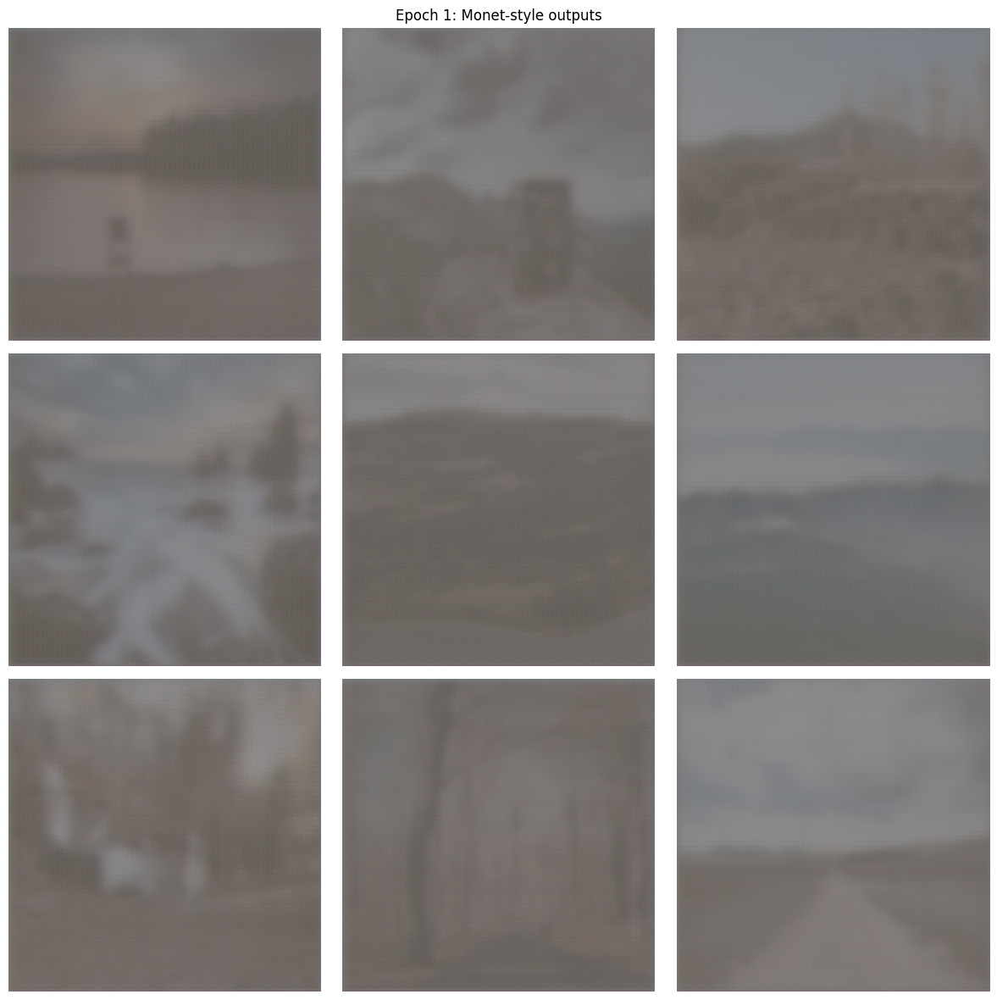


Epoch 2/5
  step    0 | G: 15.242  D: 0.446
Epoch 2 mean losses -> G: 16.000, D: 0.390


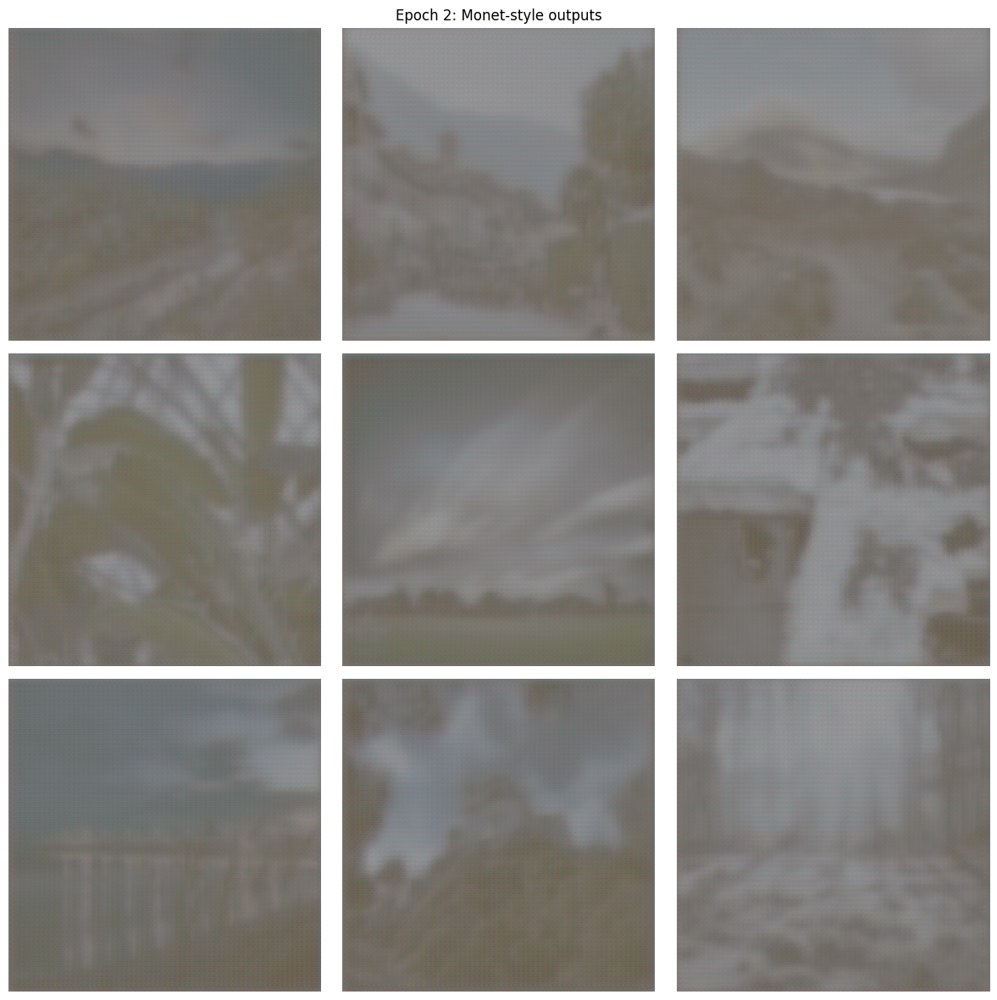


Epoch 3/5
  step    0 | G: 18.369  D: 0.580
Epoch 3 mean losses -> G: 15.839, D: 0.391


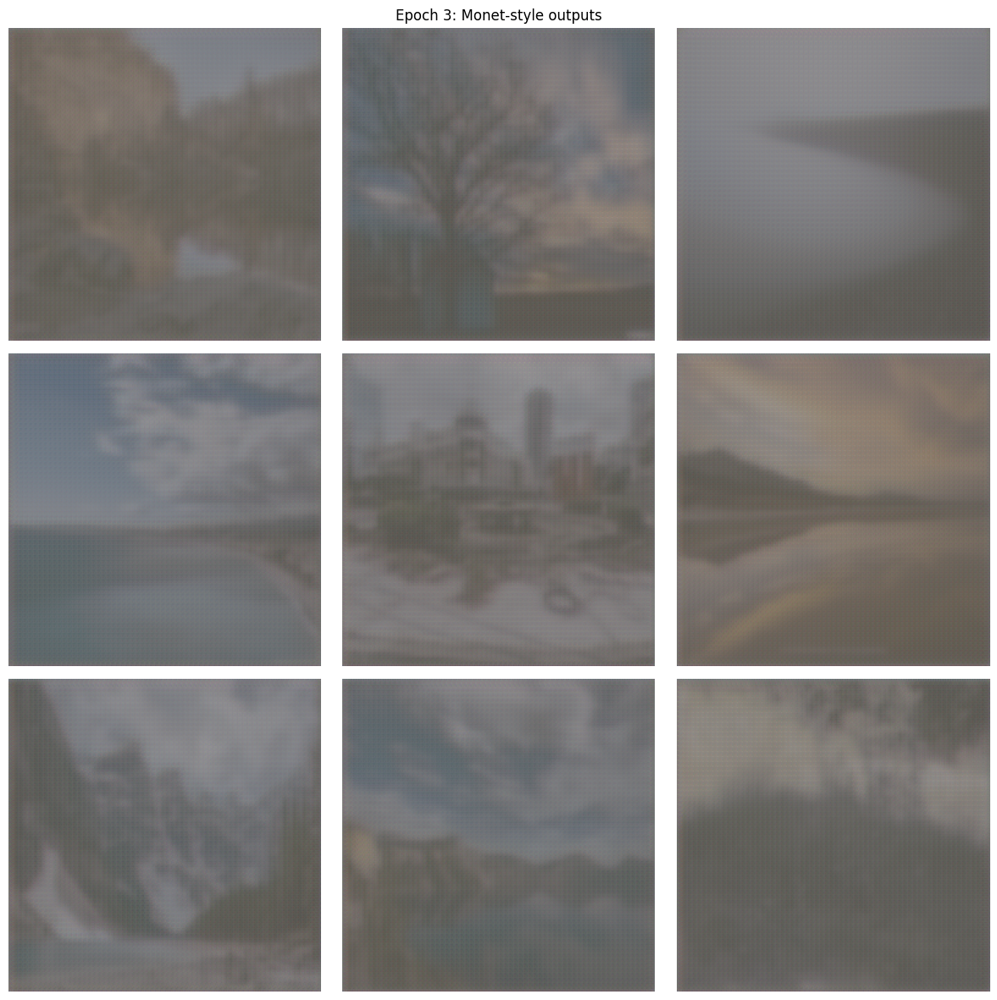


Epoch 4/5
  step    0 | G: 15.200  D: 0.369
Epoch 4 mean losses -> G: 15.239, D: 0.273


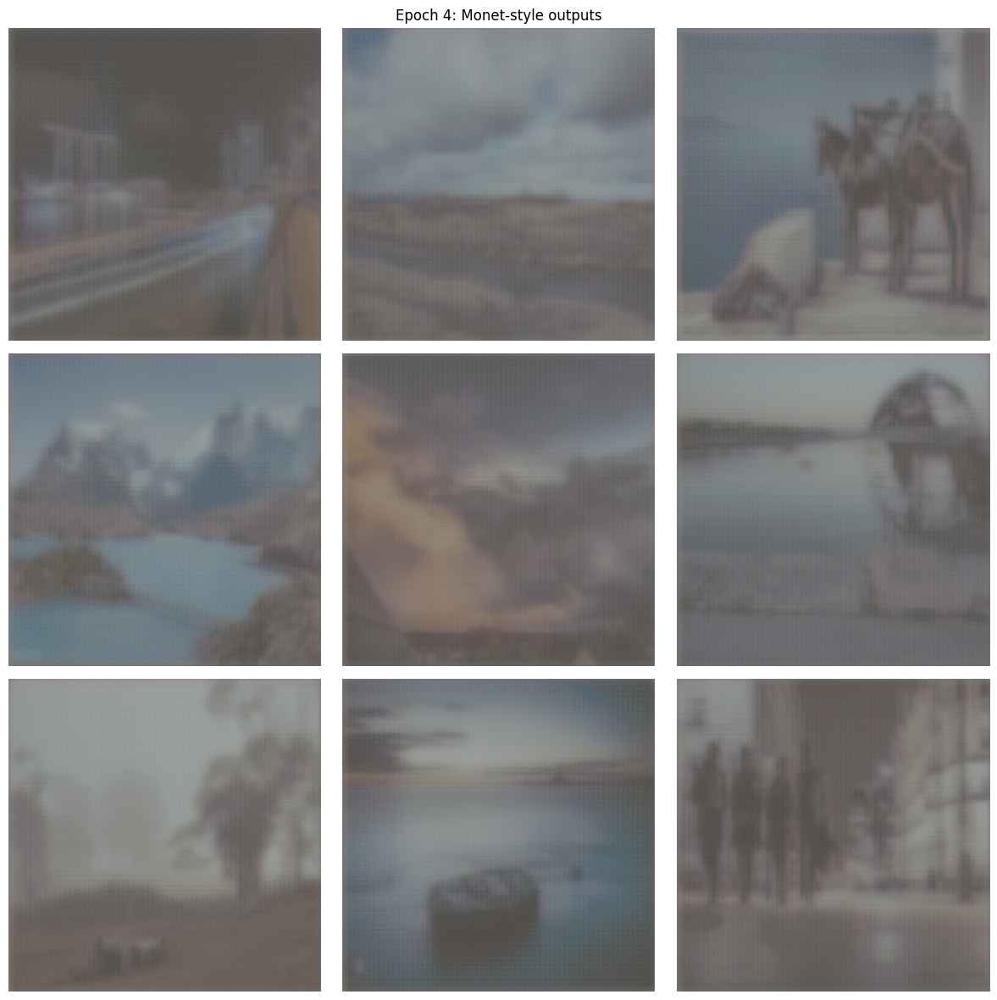


Epoch 5/5
  step    0 | G: 15.501  D: 0.167
Epoch 5 mean losses -> G: 15.210, D: 0.293


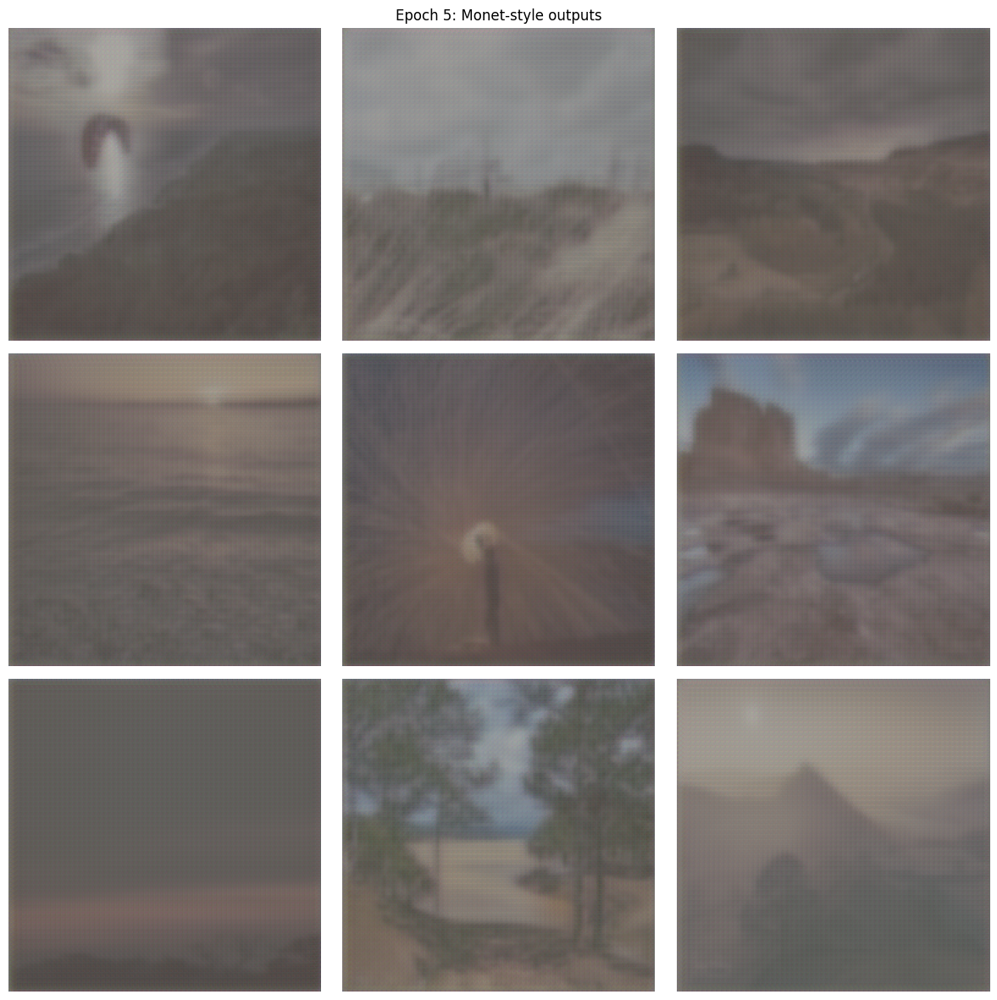

In [55]:
# Training loop
EPOCHS = 5

# Pair photos and Monet images; length is limited by the smaller dataset (Monet)
train_ds = tf.data.Dataset.zip((photo_ds, monet_ds))

history = {"gen": [], "disc": []}

for epoch in range(EPOCHS):
    print(f"\nEpoch {epoch+1}/{EPOCHS}")
    gen_losses = []
    disc_losses = []

    for step, (photos_batch, monets_batch) in enumerate(train_ds):
        losses = train_step(photos_batch, monets_batch)
        gen_losses.append(float(losses["gen_loss"]))
        disc_losses.append(float(losses["disc_loss"]))

        if step % 50 == 0:
            print(f"  step {step:4d} | "
                  f"G: {losses['gen_loss']:.3f}  "
                  f"D: {losses['disc_loss']:.3f}")

    mean_g = np.mean(gen_losses)
    mean_d = np.mean(disc_losses)
    history["gen"].append(mean_g)
    history["disc"].append(mean_d)

    print(f"Epoch {epoch+1} mean losses -> G: {mean_g:.3f}, D: {mean_d:.3f}")

    # Visual sanity check: run generator on a photo batch
    sample_photos = next(iter(photo_ds))
    fake_batch = generator_photo_to_monet(sample_photos, training=False)
    show_tensor_batch(fake_batch, title=f"Epoch {epoch+1}: Monet-style outputs")


In [ ]:
# Kaggle submission file
from pathlib import Path
from PIL import Image
import zipfile

out_dir = Path("/kaggle/working/images")
out_dir.mkdir(exist_ok=True)

def tensor_to_pil(img_tensor):
    # [-1, 1] -> [0, 255] uint8
    img = (img_tensor + 1.0) * 127.5
    img = tf.clip_by_value(img, 0, 255)
    img = tf.cast(img, tf.uint8).numpy()
    return Image.fromarray(img)

# Run generator on every photo and save
for i, p in enumerate(photo_paths):
    img = load_and_preprocess(str(p))
    img = tf.expand_dims(img, 0)
    fake = generator_photo_to_monet(img, training=False)[0]
    pil_img = tensor_to_pil(fake)
    pil_img.save(out_dir / f"image_{i}.jpg")

# Zip everything into images.zip
zip_path = "/kaggle/working/images.zip"
with zipfile.ZipFile(zip_path, "w") as z:
    for fname in os.listdir(out_dir):
        z.write(out_dir / fname, arcname=fname)

print("Created submission file:", zip_path)


## Conclusion
In this project I built a GAN that translates normal photos into Monet-style paintings using a residual encoder–decoder generator and a PatchGAN discriminator. Simple preprocessing, resizing, RGB conversion, and normalization, plus clean tf.data pipelines were enough to get stable training.

The main things that helped were:
* Using residual blocks so the model could change style without destroying the scene
* Using a PatchGAN discriminator so the model focused on local texture and brush strokes
* Adding an L1 content loss to keep the generated images aligned with the input photos

There’s still plenty of room to improve, like trying a full CycleGAN setup, adding data augmentation, or training longer with learning-rate schedules. But overall, the model does learn a recognizable Monet style and produces images that score reasonably on the MiFID metric and look visually convincing.
